In [1]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/



In [2]:
!kaggle datasets download -d utkarshsaxenadn/10-species-of-monkey-multiclass-classification

100% 531M/531M [00:30<00:00, 18.3MB/s]
100% 531M/531M [00:30<00:00, 18.0MB/s]


This is a Multi-class classification data set of 10 different classes of 10 different monkey species. These monkey species are :

1.Bald Uakari
2.Emperor Tamarin
3.Golden Monkey
4.Gray Langur
5.Hamadryas Baboon
6.Mandril
7.Proboscis Monkey
8.Red Howler
9.Vervet Monkey
10.White Faced Saki

In [3]:
import zipfile
zip_ref = zipfile.ZipFile('/content/10-species-of-monkey-multiclass-classification.zip','r')
zip_ref.extractall('/content')
zip_ref.close()

In [4]:
import numpy as np


In [5]:
import tensorflow as tf
from tensorflow import  keras
from keras import Sequential
from keras.layers import Conv2D, Flatten, Dense, MaxPooling2D, Dropout
import os
import matplotlib.pyplot as plt
from keras.utils import plot_model as ModelViz
from IPython.display import clear_output as cls

In [6]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator


train_datagen = ImageDataGenerator(rescale=1.0/255)
validation_datagen = ImageDataGenerator(rescale=1.0/255)


train_ds = train_datagen.flow_from_directory(
    '/content/Monkey Species Data/Monkey Species Data/Training Data',
    target_size=(256, 256),
    batch_size=32,
    class_mode='sparse'
)

validation_ds = validation_datagen.flow_from_directory(
    '/content/Monkey Species Data/Monkey Species Data/Prediction Data',
    target_size=(256, 256),
    batch_size=32,
    class_mode='sparse'
)

Found 10000 images belonging to 10 classes.
Found 1306 images belonging to 10 classes.


In [7]:
# # Normalize
# def process(image,label):
#   image = tf.cast(image/255., tf.float32)
#   return image, label
# train_ds = train_ds.map(process)
# validation_ds = validation_ds.map(process)

#CNN Architechture 1

In [8]:
# CNN model


model = Sequential()

model.add(Conv2D(32,kernel_size=(3,3),
                 padding = 'valid',
                 activation = 'relu',
                 input_shape = (256,256,3)))
model.add(MaxPooling2D(pool_size = (2,2), strides = 2, padding = 'valid'))

model.add(Conv2D(64,kernel_size=(3,3),
                 padding = 'valid',
                 activation = 'relu'))
model.add(MaxPooling2D(pool_size = (2,2), strides = 2, padding = 'valid'))

model.add(Conv2D(128,kernel_size=(3,3),
                 padding = 'valid',
                 activation = 'relu',))
model.add(MaxPooling2D(pool_size = (2,2), strides = 2, padding = 'valid'))


model.add(Flatten())

model.add(Dense(128,activation = 'relu'))
model.add(Dense(64,activation = 'relu'))
model.add(Dense(10,activation = 'softmax'))

In [9]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 254, 254, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 127, 127, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 125, 125, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 62, 62, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 60, 60, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 30, 30, 128)      0

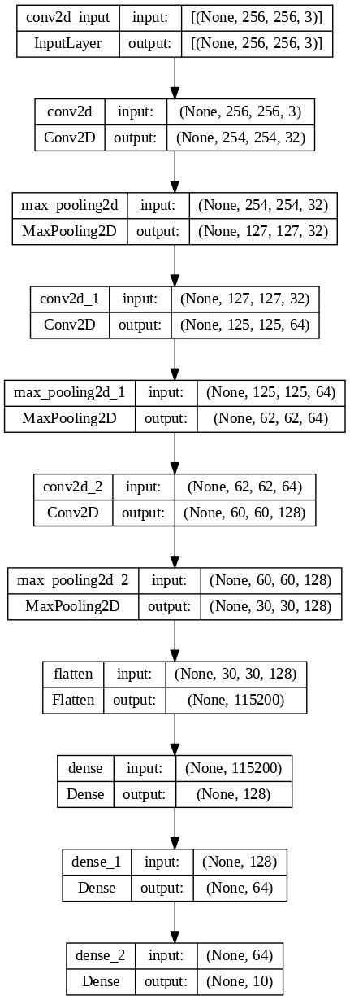

In [10]:
ModelViz(model, "CCT.png", dpi=100, show_shapes=True)

In [11]:
model.compile(optimizer = 'adam',loss ='sparse_categorical_crossentropy',
              metrics = ['accuracy'] )

In [32]:
history = model.fit(train_ds, epochs = 20, validation_data = validation_ds)

Epoch 1/20
313/313 [==============================] - 31s 100ms/step - loss: 0.0408 - accuracy: 0.9889 - val_loss: 2.0190 - val_accuracy: 0.7404
Epoch 2/20
313/313 [==============================] - 36s 114ms/step - loss: 0.0449 - accuracy: 0.9889 - val_loss: 1.9861 - val_accuracy: 0.6876
Epoch 3/20
313/313 [==============================] - 29s 94ms/step - loss: 0.0492 - accuracy: 0.9868 - val_loss: 2.0244 - val_accuracy: 0.7175
Epoch 4/20
313/313 [==============================] - 29s 93ms/step - loss: 0.0688 - accuracy: 0.9784 - val_loss: 2.3331 - val_accuracy: 0.6616
Epoch 5/20
313/313 [==============================] - 35s 110ms/step - loss: 0.0637 - accuracy: 0.9829 - val_loss: 2.4886 - val_accuracy: 0.6662
Epoch 6/20
313/313 [==============================] - 33s 107ms/step - loss: 0.0359 - accuracy: 0.9893 - val_loss: 3.0377 - val_accuracy: 0.6577
Epoch 7/20
313/313 [==============================] - 31s 98ms/step - loss: 0.0396 - accuracy: 0.9880 - val_loss: 2.3297 - val_accur

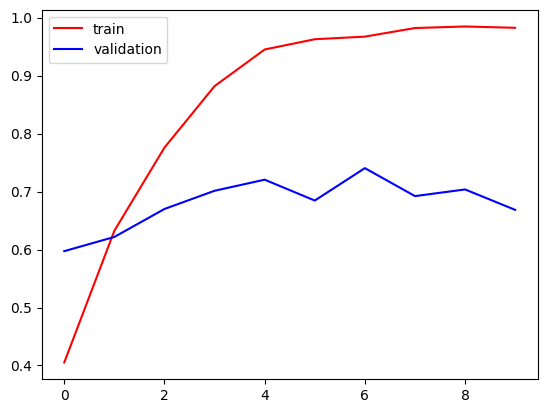

In [13]:
plt.plot(history.history['accuracy'],color = 'red',label = 'train')
plt.plot(history.history['val_accuracy'], color = 'blue', label = 'validation')
plt.legend()
plt.show()

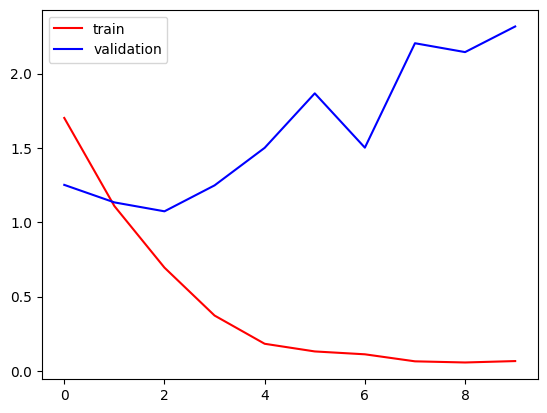

In [14]:
plt.plot(history.history['loss'],color = 'red',label = 'train')
plt.plot(history.history['val_loss'], color = 'blue', label = 'validation')
plt.legend()
plt.show()

In [15]:
class_names = sorted(os.listdir('/content/Monkey Species Data/Monkey Species Data/Training Data'))

In [16]:
def show_images(data, model=None, GRID=[5,6], SIZE=(25,25)):

    # Plot Configurations
    n_rows, n_cols = GRID
    n_images = n_rows * n_cols
    plt.figure(figsize=SIZE)

    i = 1
    for images, labels in iter(data):

        # Select Random Data

        id = np.random.randint(len(images))
        image, label = tf.expand_dims(images[id], axis=0), class_names[int(labels[id])]

        # Make Prediction
        if model is not None:
            pred = class_names[np.argmax(model.predict(image))]
            title = f"True : {label}\nPred : {pred}"
        else:
            title = f"{label}"

        # Show Data
        plt.subplot(n_rows, n_cols, i)
        plt.imshow(image[0])
        plt.axis('off')
        plt.title(title)

        # Break Loop Once Done
        i+=1
        if i>n_images:
            break
        cls()
    plt.show()

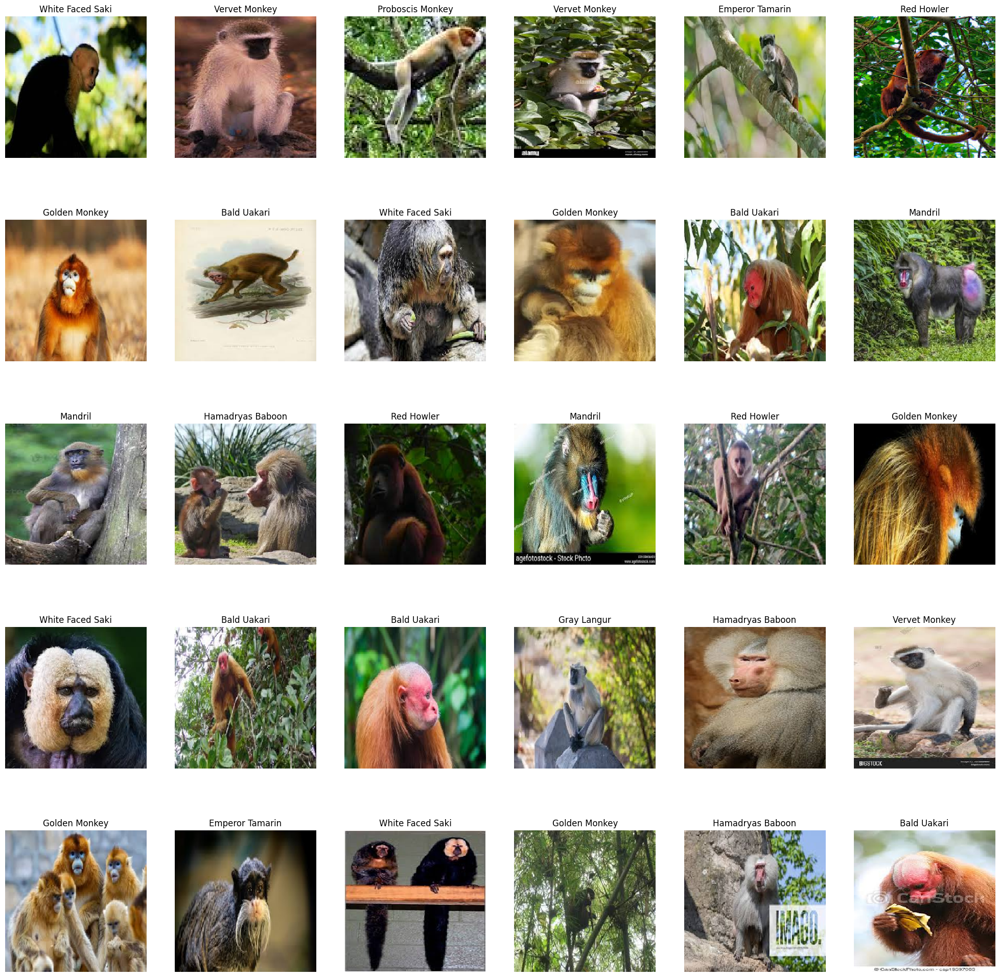

In [17]:
show_images(data = train_ds)

1/1 [==============================] - 0s 20ms/step


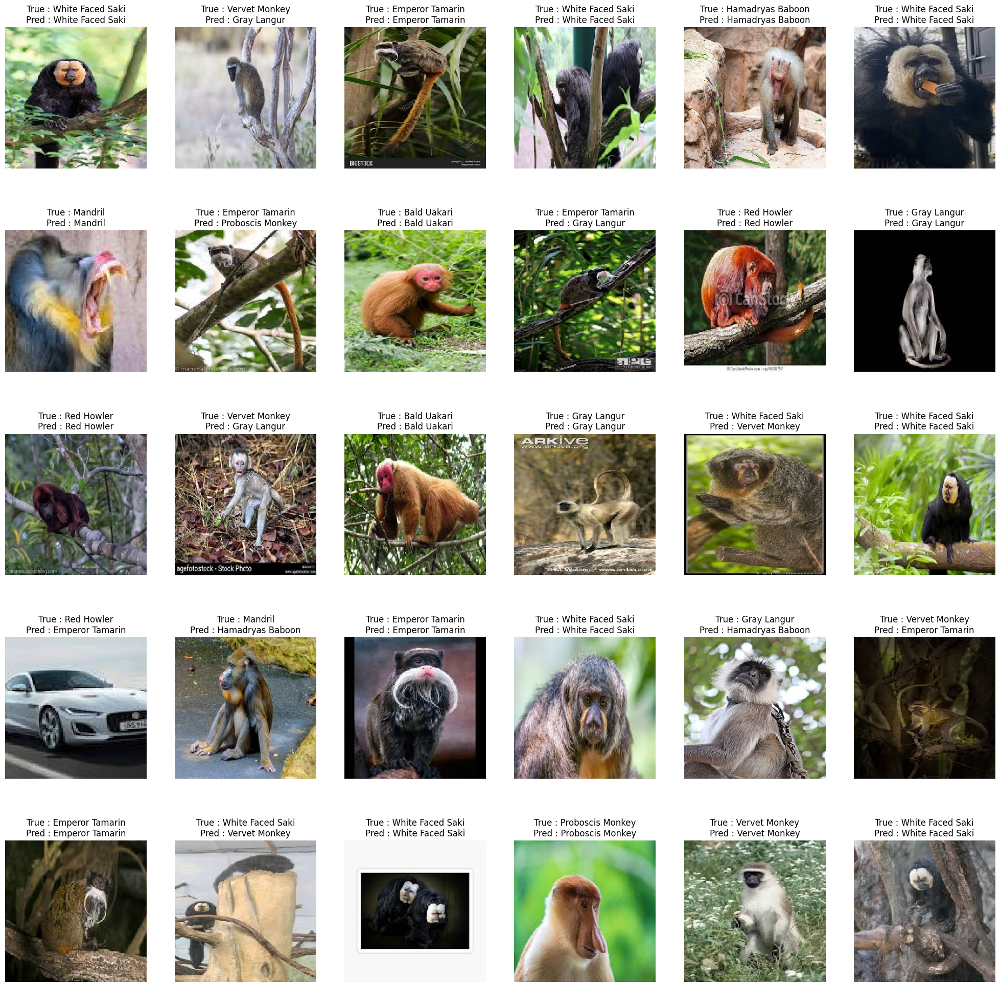

In [18]:
show_images(data = validation_ds,model = model)

In [19]:
for i,j in enumerate(class_names):
    print(i,j)

0 Bald Uakari
1 Emperor Tamarin
2 Golden Monkey
3 Gray Langur
4 Hamadryas Baboon
5 Mandril
6 Proboscis Monkey
7 Red Howler
8 Vervet Monkey
9 White Faced Saki


In [20]:
import cv2

In [21]:
test_img  = cv2.imread('/content/Monkey Species Data/Monkey Species Data/Training Data/Bald Uakari/BU (100).jpeg')

In [22]:
import matplotlib.pyplot as plt

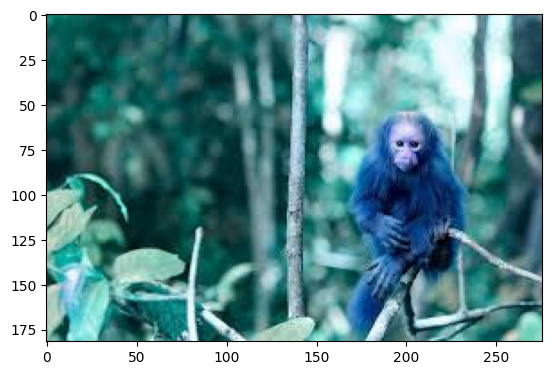

In [23]:
plt.imshow(test_img)

In [24]:
test_im2 = cv2.imread('/content/CCT.png')

# Transfer Learning

## Inception 

In [52]:
from keras.applications.inception_v3 import InceptionV3
from keras import Model

inception_v3 = InceptionV3(
    include_top=False,
    weights="imagenet",
    input_shape=(256,256,3)
)

for layers in inception_v3.layers:
    layers.trainable = False

In [53]:
op = inception_v3.output
x = Flatten()(op)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.3)(x)
x = Dense(10, activation='softmax')(x)

inception = Model(inception_v3.input, x)

In [54]:
from keras.callbacks import EarlyStopping, ModelCheckpoint

In [55]:
inception.compile(optimizer ='adam',
              loss = 'sparse_categorical_crossentropy',
              metrics = ['accuracy'])

mc_inception = ModelCheckpoint('Models\Inception.h5',
                         save_best_only=True,
                         monitor = 'val_accuracy')

es = EarlyStopping(monitor='val_accuracy',
                   patience = 10,
                   mode = 'max' ,
                   restore_best_weights= True)

In [64]:
inception_history = inception.fit(
    train_ds,
                  epochs= 100,
                  validation_data= validation_ds,
                  verbose= 1,
                  callbacks = [mc_inception,es])

Epoch 1/100
313/313 [==============================] - 44s 139ms/step - loss: 0.1996 - accuracy: 0.9500 - val_loss: 0.7123 - val_accuracy: 0.9089
Epoch 2/100
313/313 [==============================] - 41s 131ms/step - loss: 0.2275 - accuracy: 0.9389 - val_loss: 0.5174 - val_accuracy: 0.9158
Epoch 3/100
313/313 [==============================] - 40s 127ms/step - loss: 0.1681 - accuracy: 0.9524 - val_loss: 0.4978 - val_accuracy: 0.9188
Epoch 4/100
313/313 [==============================] - 40s 127ms/step - loss: 0.1633 - accuracy: 0.9539 - val_loss: 0.4966 - val_accuracy: 0.9135
Epoch 5/100
313/313 [==============================] - 39s 124ms/step - loss: 0.1301 - accuracy: 0.9630 - val_loss: 0.4935 - val_accuracy: 0.9188
Epoch 6/100
313/313 [==============================] - 40s 127ms/step - loss: 0.1478 - accuracy: 0.9585 - val_loss: 0.6400 - val_accuracy: 0.9081
Epoch 7/100
313/313 [==============================] - 39s 124ms/step - loss: 0.1664 - accuracy: 0.9532 - val_loss: 0.4859 -

       loss  accuracy  val_loss  val_accuracy
0  3.369197    0.7973  0.445897      0.859112
1  0.423098    0.8757  0.361435      0.906585
2  0.345205    0.9041  0.349543      0.908882
3  0.282483    0.9133  0.376945      0.908116
4  0.262247    0.9239  0.355960      0.906585


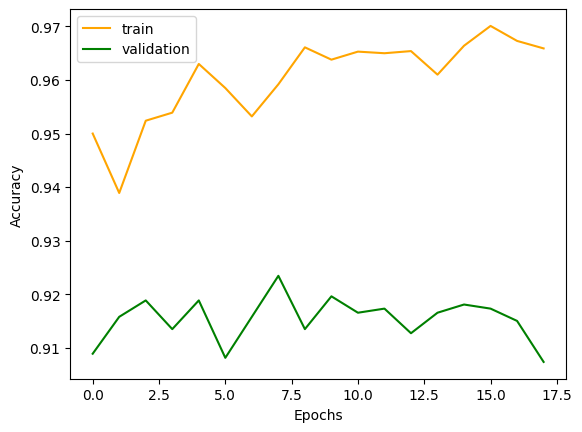

In [67]:
plt.plot(inception_history.history['accuracy'],color = 'orange',label = 'train')
plt.plot(inception_history.history['val_accuracy'], color = 'green', label = 'validation')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

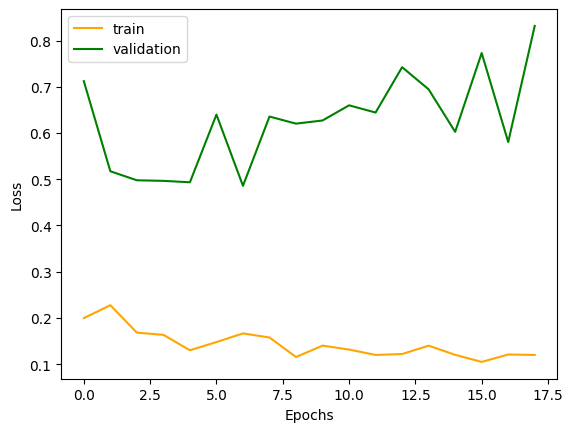

In [70]:
plt.plot(inception_history.history['loss'],color = 'orange',label = 'train')
plt.plot(inception_history.history['val_loss'], color = 'green', label = 'validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

1/1 [==============================] - 0s 43ms/step


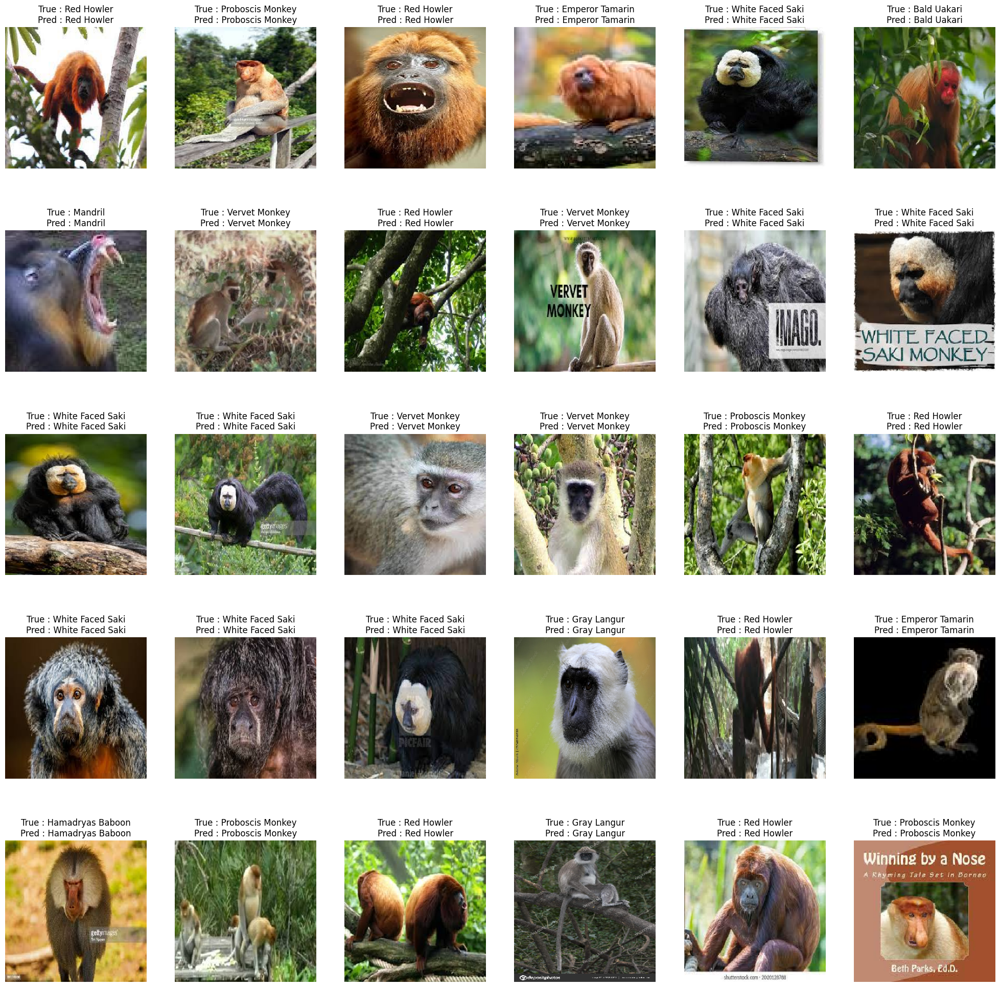

In [71]:
show_images(data = validation_ds,model = inception)